# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
import os
import tensorflow.compat.v1 as tf
import math
import numpy as np
import itertools

import matplotlib.pyplot as plt
import matplotlib.patches as patches

tf.enable_eager_execution()

from waymo_open_dataset.utils import range_image_utils
from waymo_open_dataset.utils import transform_utils
from waymo_open_dataset.utils import  frame_utils
from waymo_open_dataset import dataset_pb2 as open_dataset

%matplotlib inline

In [2]:
FILENAME = '/app/project/data_dir/training_segment-1005081002024129653_5313_150_5333_150_with_camera_labels.tfrecord'
dataset = tf.data.TFRecordDataset(FILENAME, compression_type='')
for data in dataset:
    frame = open_dataset.Frame()
    frame.ParseFromString(bytearray(data.numpy()))
    break

In [3]:
print(frame.context)

name: "1005081002024129653_5313_150_5333_150"
camera_calibrations {
  name: FRONT
  intrinsic: 2083.091212133254
  intrinsic: 2083.091212133254
  intrinsic: 957.2938286685071
  intrinsic: 650.5697927719348
  intrinsic: 0.04067236637270731
  intrinsic: -0.3374271466716414
  intrinsic: 0.0016273829099200004
  intrinsic: -0.0007879327563938157
  intrinsic: 0.0
  extrinsic {
    transform: 0.9999151800844592
    transform: -0.008280529275085654
    transform: -0.010053132426658727
    transform: 1.5444145042510942
    transform: 0.008380895965622895
    transform: 0.9999150476776223
    transform: 0.009982885888937929
    transform: -0.022877347388980857
    transform: 0.009969614810858722
    transform: -0.010066293398396434
    transform: 0.9998996332221252
    transform: 2.115953541712884
    transform: 0.0
    transform: 0.0
    transform: 0.0
    transform: 1.0
  }
  width: 1920
  height: 1280
  rolling_shutter_direction: RIGHT_TO_LEFT
}
camera_calibrations {
  name: FRONT_LEFT
  intr

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [4]:
def show_camera_image(camera_image, camera_labels, layout, cmap=None):
  """Show a camera image and the given camera labels."""

  ax = plt.subplot(*layout)

  # Draw the camera labels.
  for camera_labels in frame.camera_labels:
    # Ignore camera labels that do not correspond to this camera.
    if camera_labels.name != camera_image.name:
        continue

    # Iterate over the individual labels.
    for label in camera_labels.labels:
      # Draw the object bounding box.
      ax.add_patch(patches.Rectangle(
        xy=(label.box.center_x - 0.5 * label.box.length,
            label.box.center_y - 0.5 * label.box.width),
        width=label.box.length,
        height=label.box.width,
        linewidth=1,
        edgecolor='red',
        facecolor='none'))

  # Show the camera image.
  plt.imshow(tf.image.decode_jpeg(camera_image.image), cmap=cmap)
  plt.title(open_dataset.CameraName.Name.Name(camera_image.name))
  plt.grid(False)
  plt.axis('off')

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

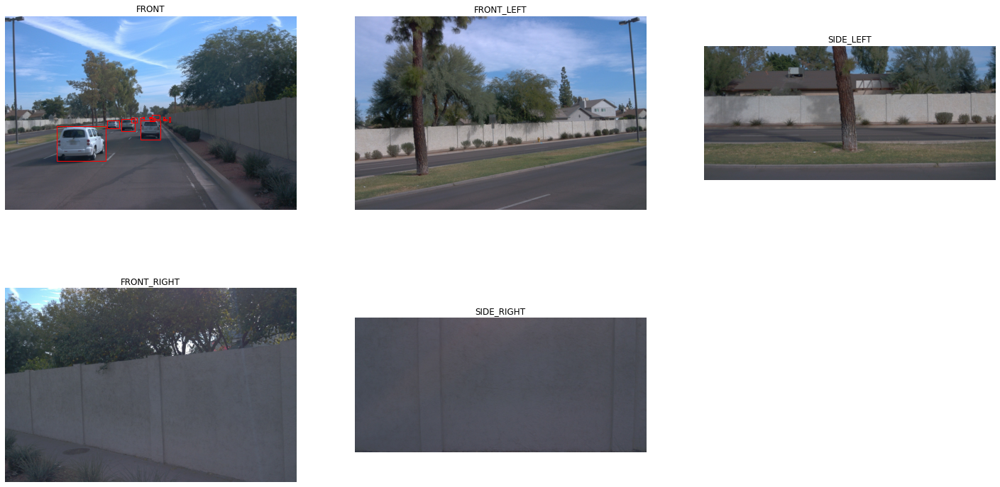

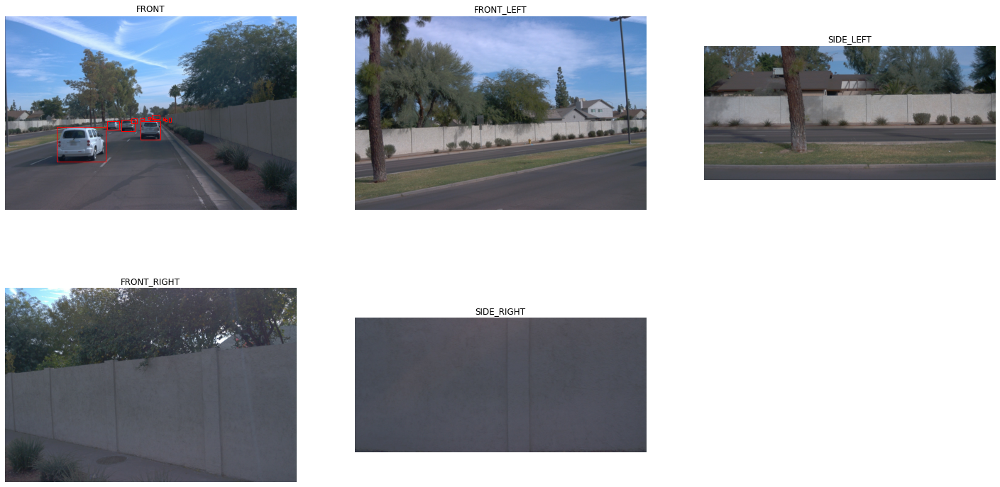

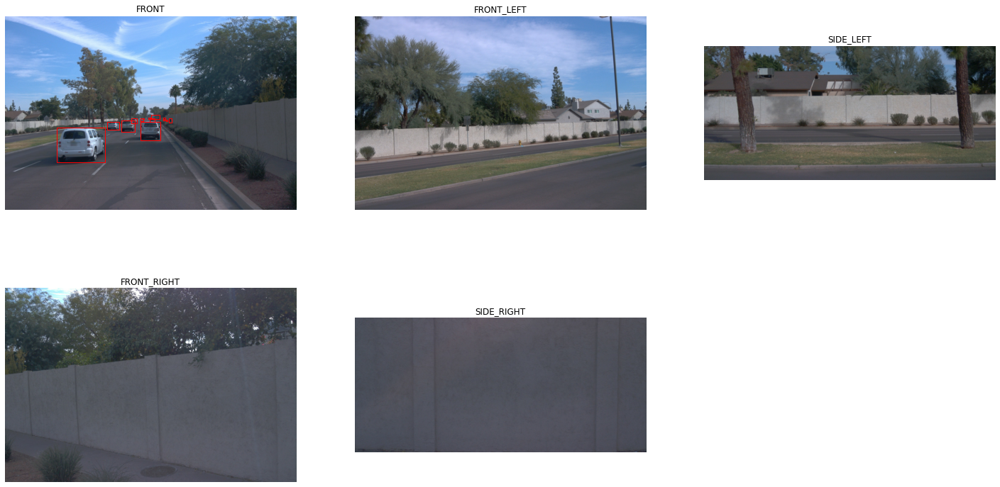

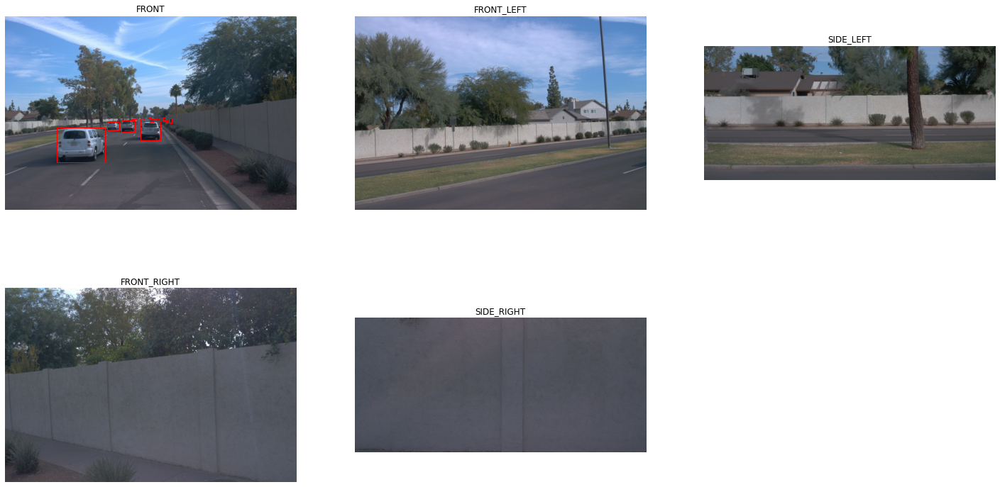

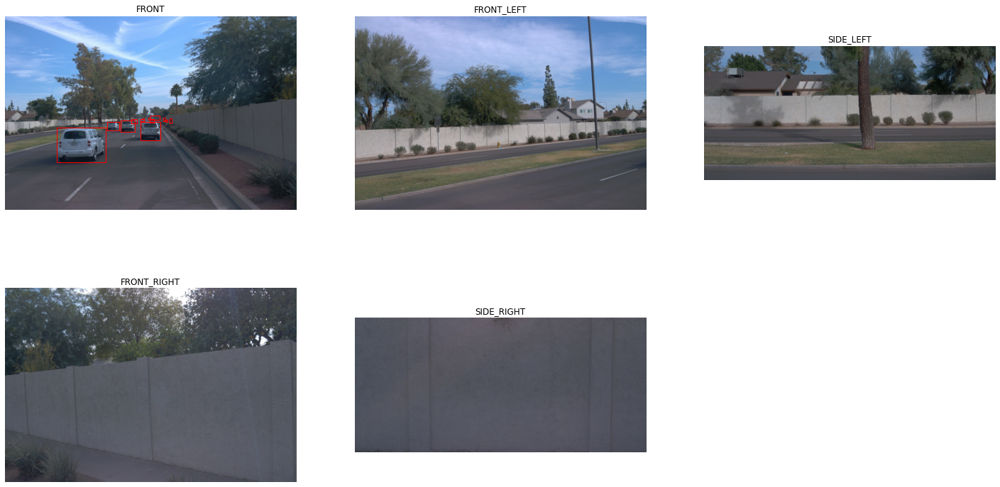

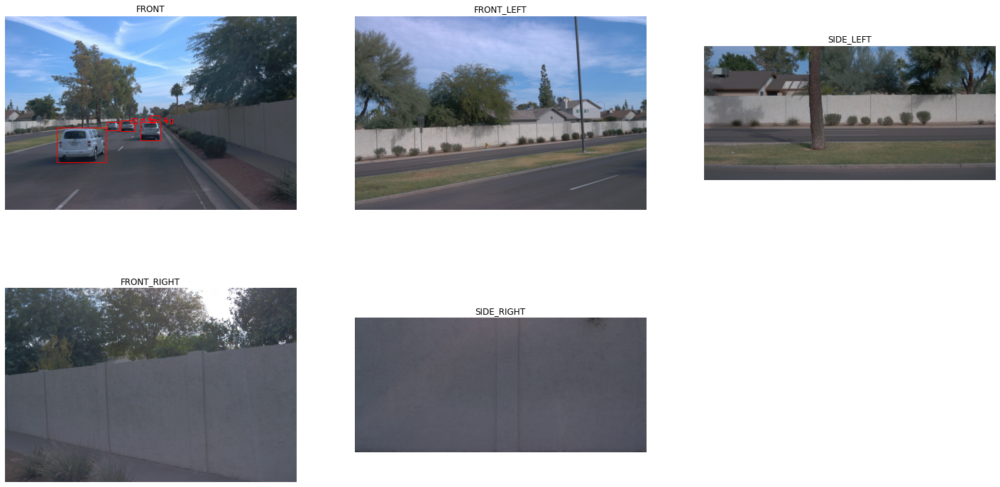

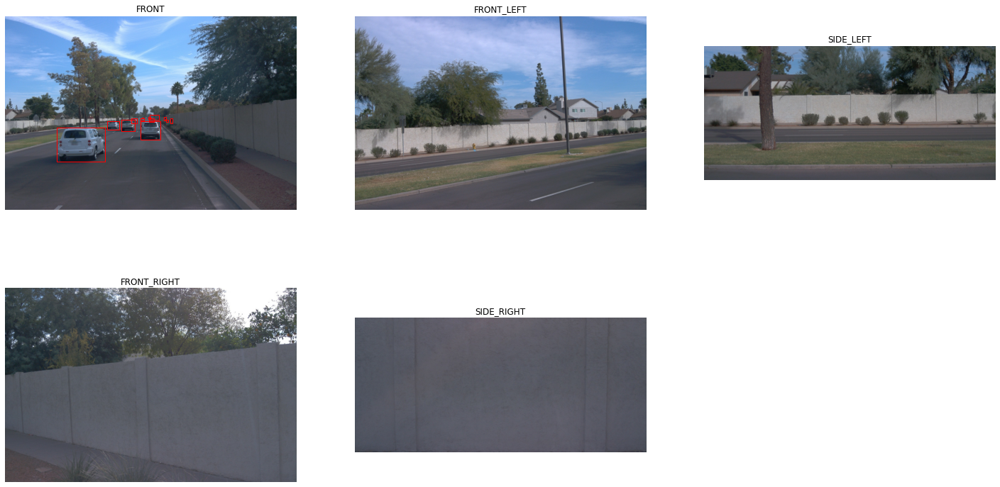

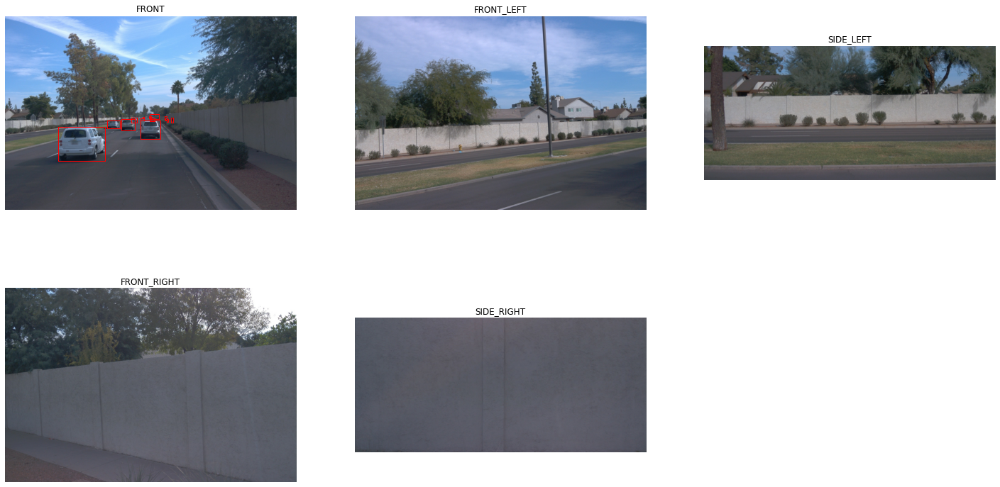

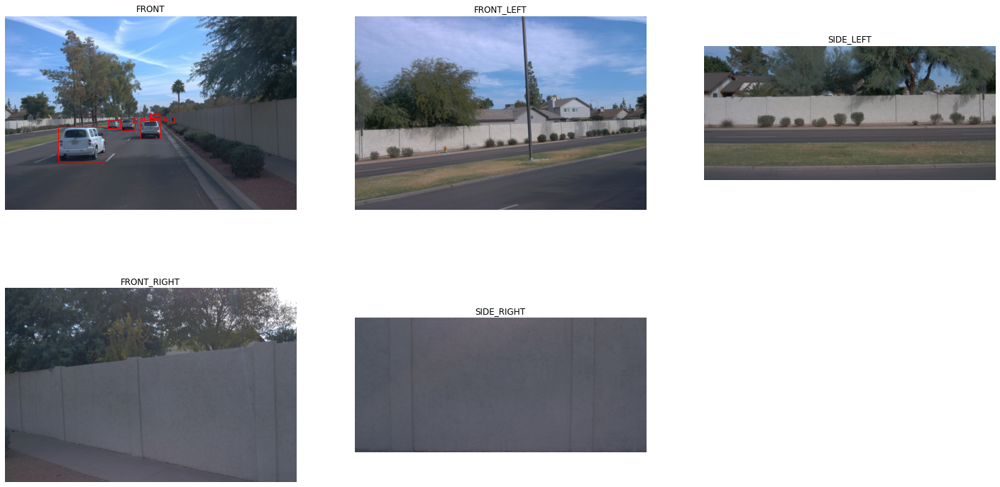

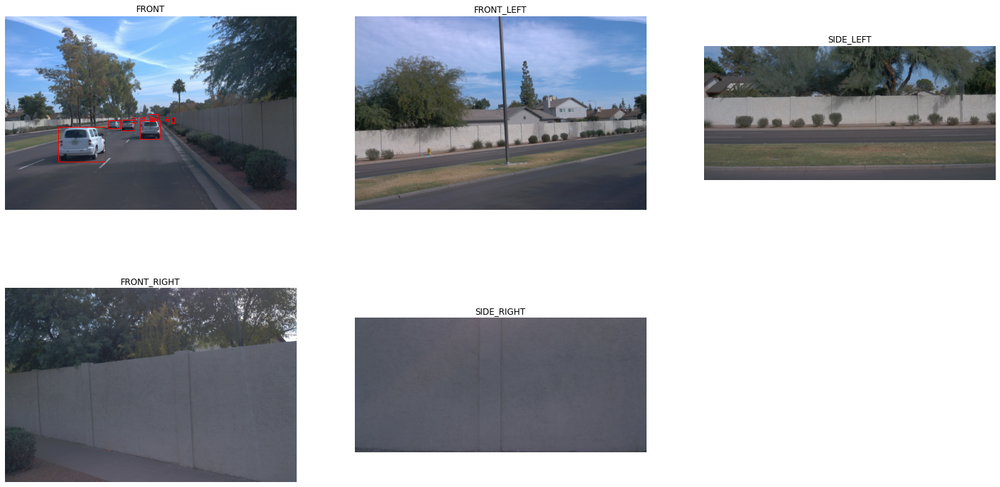

In [10]:
## STUDENT SOLUTION HERE
for data in dataset.take(10):
    plt.figure(figsize=(25, 20))
    frame = open_dataset.Frame()
    frame.ParseFromString(bytearray(data.numpy()))
    for index, image in enumerate(frame.images):
        show_camera_image(image, frame.camera_labels, [3, 3, index+1])

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [2]:
device_name = tf.test.gpu_device_name()
if not device_name:
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0
